                            CRUD operations
Create a new db name Todo and a new collection named "CRUD_exercise" and do the following:

1) Take the dict created in the TODO 4 in chapter I and save it in the collection "CRUD_exercise".

In [1]:
!pip install pymongo
import pymongo

  Obtaining dependency information for pymongo from https://files.pythonhosted.org/packages/0c/04/573162bfcbab56d059d2d9067048f51935464ffb9b74716016bad806df39/pymongo-4.7.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for dnspython<3.0.0,>=1.16.0 from https://files.pythonhosted.org/packages/87/a1/8c5287991ddb8d3e4662f71356d9656d91ab3a36618c3dd11b280df0d255/dnspython-2.6.1-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/484.7 kB ? eta -:--:--
   --- ----------------------------------- 41.0/484.7 kB 991.0 kB/s eta 0:00:01
   ----------- ---------------------------- 143.4/484.7 kB 2.1 MB/s eta 0:00:01
   ------------------------- -------------- 307.2/484.7 kB 2.4 MB/s eta 0:00:01
   ----------------------------------- ---- 430.1/484.7 kB 2.4 MB/s eta 0:00:01
   ---------------------------------------- 484.7/484.7 kB 2.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/307.7 kB ? eta -:--:--
   ------------------ ----------

In [9]:
client = pymongo.MongoClient('localhost', 27017)
mydb = client["Todo"]
collection =mydb["CRUD_exercise"]

In [10]:
post = {"authors" : ["Auteur1","Auteur2","Auteur3"],
         "title" : "This is paper 1",
         "affiliations" : ["University of Mannheim","University of Strasbourg","University of wonders"],
         "ref" : ["This is ref 1","This is ref 2","This is ref 3"]}
# Inserting this single dict in mongodb
collection.insert_one(post)

InsertOneResult(ObjectId('6635305e993373ecffd1ccd2'), acknowledged=True)

2) Insert 3 documents with key = x and values = 1, delete one of them. Which one is deleted first ?
    the most recent or oldest one ? increment the value of x to 4.

In [11]:
import tqdm
import pymongo

client = pymongo.MongoClient('localhost', 27017)
mydb = client["Todo"]
collection = mydb["CRUD_exercise"]

# in each it insert the dict {"x":1}
for i in tqdm.tqdm(range(3)):
    post = {"x":1}
    collection.insert_one(post)

100%|██████████| 3/3 [00:00<00:00, 211.89it/s]


In [12]:
collection.delete_one({'x': 1})
##the oldest is the one that is deleted

DeleteResult({'n': 1, 'ok': 1.0}, acknowledged=True)

In [13]:
collection.update_many({'x': 1}, {'$inc': {'x': 3}})

UpdateResult({'n': 2, 'nModified': 2, 'ok': 1.0, 'updatedExisting': True}, acknowledged=True)

        3) Insert the dict created in the TODO 6 Chapter I in the example collection.

In [36]:
import pymongo
import lxml.etree
import xmltodict
import json

# Connexion à MongoDB
client = pymongo.MongoClient('localhost', 27017)
mydb = client["Todo"]
collection = mydb["CRUD_exercise"]

# Chargement et parsing du fichier XML
xml_file = "C:/Users/sacha/Downloads/xml_file2.nxml"
with open(xml_file, "rb") as file:
    xml_dict = xmltodict.parse(file)

# Insertion du dictionnaire XML dans MongoDB
result = collection.insert_one(xml_dict)
print(f"Document inséré avec l'ID: {result.inserted_id}")

Document inséré avec l'ID: 662a53e11d3b67b6d0440ec7


In [16]:
import datetime
import pymongo

client = pymongo.MongoClient('localhost', 27017)
mydb = client["Todo"]
collection = mydb["CRUD_exercise"]

# new_posts = list of dicts [{},{}]
new_posts = [{"author": "Mike",
              "title":"Python is fun",
               "text": "Another post!",
               "tags": ["bulk", "insert"],
              # date object format (year,month,day,hour,minute)
               "date": datetime.datetime(2009, 11, 12, 11, 14)},
              {"author": "Eliot",
               "title": "MongoDB is fun",
               "text": "and pretty easy too!",
               "date": datetime.datetime(2009, 11, 10, 10, 45)}]

collection.insert_many(new_posts)

InsertManyResult([ObjectId('6635309c993373ecffd1ccdb'), ObjectId('6635309c993373ecffd1ccdc')], acknowledged=True)

        4) Get documents where authors key exist in the collection "CRUD_exercise".

In [17]:
query = {"authors": {"$exists": True}}
result = collection.find(query)
for document in result:
    print(document)

{'_id': ObjectId('6635305e993373ecffd1ccd2'), 'authors': ['Auteur1', 'Auteur2', 'Auteur3'], 'title': 'This is paper 1', 'affiliations': ['University of Mannheim', 'University of Strasbourg', 'University of wonders'], 'ref': ['This is ref 1', 'This is ref 2', 'This is ref 3']}


        5) Change the documents where x = 4 to x = 1

In [18]:
client = pymongo.MongoClient('localhost', 27017)
mydb = client["Todo"]
collection =mydb["CRUD_exercise"]
collection.update_many({'x': 4}, {'$inc': {'x': -3}})

UpdateResult({'n': 2, 'nModified': 2, 'ok': 1.0, 'updatedExisting': True}, acknowledged=True)

        6) Find documents where author is not_mike and set author as real_mike.

In [20]:
doc=collection.update_many({"author": {"$ne": "mike"}},
                      {'$set': {
                          'author': "real_mike"
                          }
                      }, upsert=False)
print(doc)

UpdateResult({'n': 7, 'nModified': 6, 'ok': 1.0, 'updatedExisting': True}, acknowledged=True)


        7) Delete documents where author is real_mike.

In [21]:
collection.delete_many({'author': 'real_mike'})

DeleteResult({'n': 7, 'ok': 1.0}, acknowledged=True)

                        MANAGING DB

    8) create a collection named "CRUD_exercise_benchmark" with 500k observations, ids increment of 2 (sequence:0,2,4,6,...1M). Give a random np.array with a key named "values" and use the insert_many. Then create an index on the id and benchmark queries before and after indexing. Did the index help ?

In [22]:
client = pymongo.MongoClient('localhost', 27017)
mydb = client["Todo"]
collection = mydb["CRUD_exercise_benchmark"]

In [23]:
import numpy as np
import pymongo
import tqdm


list_of_insertion = []
for i in tqdm.tqdm(range(1, 500001, 2)):
    # Générer un tableau NumPy aléatoire de taille 10
    values_array = np.random.rand(1)
    
    # Créer le document à insérer
    post = {
        "user_id": i,
        "values": values_array.tolist()  # Convertir le tableau NumPy en liste pour l'insertion dans MongoDB
    }
    
    # Ajouter le document à la liste des insertions
    list_of_insertion.append(post)
    
    # Insérer les documents par lots de 15000
    if i % 15000 == 0:
        collection.insert_many(list_of_insertion)
        list_of_insertion = []

# Insérer les documents restants
if list_of_insertion:
    collection.insert_many(list_of_insertion)


100%|██████████| 250000/250000 [00:00<00:00, 275234.28it/s]


In [24]:
collection.find( { "user_id": 7000 } ).explain()['executionStats']

{'executionSuccess': True,
 'nReturned': 0,
 'executionTimeMillis': 224,
 'totalKeysExamined': 0,
 'totalDocsExamined': 250000,
 'executionStages': {'stage': 'COLLSCAN',
  'filter': {'user_id': {'$eq': 7000}},
  'nReturned': 0,
  'executionTimeMillisEstimate': 19,
  'works': 250001,
  'advanced': 0,
  'needTime': 250000,
  'needYield': 0,
  'saveState': 250,
  'restoreState': 250,
  'isEOF': 1,
  'direction': 'forward',
  'docsExamined': 250000},
 'allPlansExecution': []}

In [25]:
collection.create_index([ ("user_id",1) ])

'user_id_1'

In [26]:
collection.find( { "user_id": 7000} ).explain()['executionStats']

{'executionSuccess': True,
 'nReturned': 0,
 'executionTimeMillis': 15,
 'totalKeysExamined': 0,
 'totalDocsExamined': 0,
 'executionStages': {'stage': 'FETCH',
  'nReturned': 0,
  'executionTimeMillisEstimate': 10,
  'works': 1,
  'advanced': 0,
  'needTime': 0,
  'needYield': 0,
  'saveState': 0,
  'restoreState': 0,
  'isEOF': 1,
  'docsExamined': 0,
  'alreadyHasObj': 0,
  'inputStage': {'stage': 'IXSCAN',
   'nReturned': 0,
   'executionTimeMillisEstimate': 10,
   'works': 1,
   'advanced': 0,
   'needTime': 0,
   'needYield': 0,
   'saveState': 0,
   'restoreState': 0,
   'isEOF': 1,
   'keyPattern': {'user_id': 1},
   'indexName': 'user_id_1',
   'isMultiKey': False,
   'multiKeyPaths': {'user_id': []},
   'isUnique': False,
   'isSparse': False,
   'isPartial': False,
   'indexVersion': 2,
   'direction': 'forward',
   'indexBounds': {'user_id': ['[7000, 7000]']},
   'keysExamined': 0,
   'seeks': 1,
   'dupsTested': 0,
   'dupsDropped': 0}},
 'allPlansExecution': []}

       9) create a random collection in a random db and put the new collection in the tutorial DB

In [27]:
# get a sample

import pymongo

client = pymongo.MongoClient('localhost', 27017)
mydb = client["tutorial"]
collection = mydb["random"]

docs = collection.aggregate([{ "$sample": { "size": 10000 } }])

print(len(list(docs)))

0


          10) What is the difference between an inner join and an outer join ? 
      Is the query seen during course an inner or outer join ? Play with the query to show all the joins.

       An inner join only returns rows with matching values in the related column(s)/keys,
       while an outer join returns all rows from both tables, including unmatched rows 
       with NULL values for non-matching rows. The query seen in class was an inner join, only the values that
       were in both collections were shown. 


In [28]:
import tqdm
import pymongo

client = pymongo.MongoClient('localhost',27017)
mydb = client["tutorial"]
collection = mydb["benchmark"]

# Note that if you use insert_one, this operation will take more than an hour
# init list of insertion for insert_many

list_of_insertion = []
for i in tqdm.tqdm(range(10000)):
    post = {"user_id":i,
           "user_name":"John"}
    list_of_insertion.append(post)
    #if iteration divisible by 15k then insert the list and reset the list
    if i % 15000 == 0:
        collection.insert_many(list_of_insertion)
        list_of_insertion = []
        
collection.insert_many(list_of_insertion)

100%|██████████| 10000/10000 [00:00<00:00, 397154.03it/s]


InsertManyResult([ObjectId('66353241993373ecffd59d72'), ObjectId('66353241993373ecffd59d73'), ObjectId('66353241993373ecffd59d74'), ObjectId('66353241993373ecffd59d75'), ObjectId('66353241993373ecffd59d76'), ObjectId('66353241993373ecffd59d77'), ObjectId('66353241993373ecffd59d78'), ObjectId('66353241993373ecffd59d79'), ObjectId('66353241993373ecffd59d7a'), ObjectId('66353241993373ecffd59d7b'), ObjectId('66353241993373ecffd59d7c'), ObjectId('66353241993373ecffd59d7d'), ObjectId('66353241993373ecffd59d7e'), ObjectId('66353241993373ecffd59d7f'), ObjectId('66353241993373ecffd59d80'), ObjectId('66353241993373ecffd59d81'), ObjectId('66353241993373ecffd59d82'), ObjectId('66353241993373ecffd59d83'), ObjectId('66353241993373ecffd59d84'), ObjectId('66353241993373ecffd59d85'), ObjectId('66353241993373ecffd59d86'), ObjectId('66353241993373ecffd59d87'), ObjectId('66353241993373ecffd59d88'), ObjectId('66353241993373ecffd59d89'), ObjectId('66353241993373ecffd59d8a'), ObjectId('66353241993373ecffd59d

In [29]:
# Create benchmark 2

import tqdm

collection = mydb["benchmark_2"]

# Note that if you use insert_one, this operation will take more than an hour
list_of_insertion = []

# range of 1 to 100k but increment by 2 instead of 1
for i in tqdm.tqdm(range(1,1000,2)):
    post = {"user_id":i,
           "random_value":i*100}
    list_of_insertion.append(post)
    if i % 15000 == 0:
        collection.insert_many(list_of_insertion)
        list_of_insertion = []
collection.insert_many(list_of_insertion)

100%|██████████| 500/500 [00:00<00:00, 535944.80it/s]


InsertManyResult([ObjectId('66353247993373ecffd5c481'), ObjectId('66353247993373ecffd5c482'), ObjectId('66353247993373ecffd5c483'), ObjectId('66353247993373ecffd5c484'), ObjectId('66353247993373ecffd5c485'), ObjectId('66353247993373ecffd5c486'), ObjectId('66353247993373ecffd5c487'), ObjectId('66353247993373ecffd5c488'), ObjectId('66353247993373ecffd5c489'), ObjectId('66353247993373ecffd5c48a'), ObjectId('66353247993373ecffd5c48b'), ObjectId('66353247993373ecffd5c48c'), ObjectId('66353247993373ecffd5c48d'), ObjectId('66353247993373ecffd5c48e'), ObjectId('66353247993373ecffd5c48f'), ObjectId('66353247993373ecffd5c490'), ObjectId('66353247993373ecffd5c491'), ObjectId('66353247993373ecffd5c492'), ObjectId('66353247993373ecffd5c493'), ObjectId('66353247993373ecffd5c494'), ObjectId('66353247993373ecffd5c495'), ObjectId('66353247993373ecffd5c496'), ObjectId('66353247993373ecffd5c497'), ObjectId('66353247993373ecffd5c498'), ObjectId('66353247993373ecffd5c499'), ObjectId('66353247993373ecffd5c4

In [30]:
import pymongo

client = pymongo.MongoClient('localhost', 27017)
mydb = client["tutorial"]
collection = mydb["benchmark"]

pipeline = [{'$lookup': 
                {'from' : 'benchmark_2',
                 'localField' : 'user_id',
                 'foreignField' : 'user_id',
                 'as' : 'cellmodels'}},
            {'$unwind': '$cellmodels'},
            {'$project': 
                {'user_id':1,"user_name":1, 'cellmodels.user_id':1, 'cellmodels.random_value':1}} 
             ]

documents = collection.aggregate(pipeline)
for i in range(20):
    print(next(documents))

    
    ### On peut voir qu'il y a inner join

{'_id': ObjectId('66353241993373ecffd59d72'), 'user_id': 1, 'user_name': 'John', 'cellmodels': {'user_id': 1, 'random_value': 100}}
{'_id': ObjectId('66353241993373ecffd59d74'), 'user_id': 3, 'user_name': 'John', 'cellmodels': {'user_id': 3, 'random_value': 300}}
{'_id': ObjectId('66353241993373ecffd59d76'), 'user_id': 5, 'user_name': 'John', 'cellmodels': {'user_id': 5, 'random_value': 500}}
{'_id': ObjectId('66353241993373ecffd59d78'), 'user_id': 7, 'user_name': 'John', 'cellmodels': {'user_id': 7, 'random_value': 700}}
{'_id': ObjectId('66353241993373ecffd59d7a'), 'user_id': 9, 'user_name': 'John', 'cellmodels': {'user_id': 9, 'random_value': 900}}
{'_id': ObjectId('66353241993373ecffd59d7c'), 'user_id': 11, 'user_name': 'John', 'cellmodels': {'user_id': 11, 'random_value': 1100}}
{'_id': ObjectId('66353241993373ecffd59d7e'), 'user_id': 13, 'user_name': 'John', 'cellmodels': {'user_id': 13, 'random_value': 1300}}
{'_id': ObjectId('66353241993373ecffd59d80'), 'user_id': 15, 'user_nam

In [38]:
import pymongo

client = pymongo.MongoClient('localhost', 27017)
mydb = client["tutorial"]
collection = mydb["benchmark"]

pipeline = [{'$lookup': 
                {'from' : 'benchmark_2',
                 'localField' : 'user_id',
                 'foreignField' : 'user_id',
                 'as' : 'cellmodels'}},
        
            {'$project': 
                {'user_id':1,"user_name":1, 'cellmodels.user_id':1, 'cellmodels.random_value':1}} 
             ]

documents = collection.aggregate(pipeline)
for i in range(20):
    print(next(documents))

    
    ### On peut voir qu'il y a LEFT join--> on a toutes les documents de benchmark 

{'_id': ObjectId('662a50d71d3b67b6d033a596'), 'user_id': 0, 'user_name': 'John', 'cellmodels': []}
{'_id': ObjectId('662a50d71d3b67b6d033a597'), 'user_id': 1, 'user_name': 'John', 'cellmodels': [{'user_id': 1, 'random_value': 100}]}
{'_id': ObjectId('662a50d71d3b67b6d033a598'), 'user_id': 2, 'user_name': 'John', 'cellmodels': []}
{'_id': ObjectId('662a50d71d3b67b6d033a599'), 'user_id': 3, 'user_name': 'John', 'cellmodels': [{'user_id': 3, 'random_value': 300}]}
{'_id': ObjectId('662a50d71d3b67b6d033a59a'), 'user_id': 4, 'user_name': 'John', 'cellmodels': []}
{'_id': ObjectId('662a50d71d3b67b6d033a59b'), 'user_id': 5, 'user_name': 'John', 'cellmodels': [{'user_id': 5, 'random_value': 500}]}
{'_id': ObjectId('662a50d71d3b67b6d033a59c'), 'user_id': 6, 'user_name': 'John', 'cellmodels': []}
{'_id': ObjectId('662a50d71d3b67b6d033a59d'), 'user_id': 7, 'user_name': 'John', 'cellmodels': [{'user_id': 7, 'random_value': 700}]}
{'_id': ObjectId('662a50d71d3b67b6d033a59e'), 'user_id': 8, 'user_na

                                Real world problems
11: Use the oaipmh and api code get papers after January 2020 and for "cs,math,econ" categories. 
    Insert them in MongoDB. Import only the first 200. How is it sorted ? How can you define your own sort()? Query papers to  get papers after 2021, which have 3 authors and with domain "cs".


In [42]:
!pip install feedparser

  Obtaining dependency information for feedparser from https://files.pythonhosted.org/packages/7c/d4/8c31aad9cc18f451c49f7f9cfb5799dadffc88177f7917bc90a66459b1d7/feedparser-6.0.11-py3-none-any.whl.metadata
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/81.3 kB ? eta -:--:--
   ----- ---------------------------------- 10.2/81.3 kB ? eta -:--:--
   ----------------------------------- ---- 71.7/81.3 kB 991.0 kB/s eta 0:00:01
   ---------------------------------------- 81.3/81.3 kB 1.1 MB/s eta 0:00:00
  Created wheel for sgmllib3k: filename=sgmllib3k-1.0.0-py3-none-any.whl size=6061 sha256=c3380b843c1fa8979b96c9e9c2f20505043ff75a19c5e2c13e5876273d92e52a
  Stored in directory: c:\users\sacha\appdata\local\pip\cache\wheels\3b\25\2a\105d6a15df6914f4d15047691c6c28f9052cc1173e40285d03
Successfully built sgmllib3k


In [1]:
import requests
import feedparser
import tqdm
import time
import pymongo

# For each id get all the metadata https://info.arxiv.org/help/api/basics.html#python_simple_example

client = pymongo.MongoClient('localhost',27017)
mydb = client["tutorial"]
collection = mydb["arxiv_api"]

# get list of ids previously downloaded
with open("C:/Users/sacha/Downloads/arxiv_cs.txt","r") as lines:
    ids = list(set(lines.read().split("\n")[0:-2]))

#init list of ids and iteration
ids_query = []

# loop through ids
for id_ in tqdm.tqdm(ids):
    #append id to list
    ids_query.append(id_)
    # if len list = 100 
    if len(ids_query) == 100 :
        # collapse list of id
        ids_query = ",".join(ids_query)
        # query the api for the 100 ids
        response = requests.get('http://export.arxiv.org/api/query?id_list={}&max_results=100'.format(ids_query))
        # parse response
        feed = feedparser.parse(response.content)
        # commit the 100 papers found
        list_of_insertion = []
        for entry in feed.entries:
            list_of_insertion.append(dict(entry))
        collection.insert_many(list_of_insertion)
        ids_query = []
        time.sleep(1/3)

  1%|          | 5599/617968 [02:01<3:42:18, 45.91it/s]


KeyboardInterrupt: 

In [51]:
client = pymongo.MongoClient('localhost',27017)
mydb = client["tutorial"]

collection = mydb["arxiv_api"]
papers = collection.find({
    "published_parsed": {"$gte": "2021-01-01T00:00:00Z"},
    "$where": "this.authors.length === 3",
    "arxiv_primary_category.term": "cs"
})

for paper in papers:
    print(paper)

12: Do the same as exercise 8 but with the connection to the cluster. Then check the metrics and take screenshot of opcounters, logical size and connections.

In [31]:
collection.find( { "id": "http://arxiv.org/abs/2401.01379v1"} ).explain()['executionStats']

{'executionSuccess': True,
 'nReturned': 0,
 'executionTimeMillis': 8,
 'totalKeysExamined': 0,
 'totalDocsExamined': 10000,
 'executionStages': {'stage': 'COLLSCAN',
  'filter': {'id': {'$eq': 'http://arxiv.org/abs/2401.01379v1'}},
  'nReturned': 0,
  'executionTimeMillisEstimate': 0,
  'works': 10001,
  'advanced': 0,
  'needTime': 10000,
  'needYield': 0,
  'saveState': 10,
  'restoreState': 10,
  'isEOF': 1,
  'direction': 'forward',
  'docsExamined': 10000},
 'allPlansExecution': []}

In [32]:
collection.create_index([("id", 1)])

'id_1'

In [33]:
collection.find( { "id": "http://arxiv.org/abs/2401.01379v1"} ).explain()['executionStats']

{'executionSuccess': True,
 'nReturned': 0,
 'executionTimeMillis': 10,
 'totalKeysExamined': 0,
 'totalDocsExamined': 0,
 'executionStages': {'stage': 'FETCH',
  'nReturned': 0,
  'executionTimeMillisEstimate': 9,
  'works': 1,
  'advanced': 0,
  'needTime': 0,
  'needYield': 0,
  'saveState': 0,
  'restoreState': 0,
  'isEOF': 1,
  'docsExamined': 0,
  'alreadyHasObj': 0,
  'inputStage': {'stage': 'IXSCAN',
   'nReturned': 0,
   'executionTimeMillisEstimate': 9,
   'works': 1,
   'advanced': 0,
   'needTime': 0,
   'needYield': 0,
   'saveState': 0,
   'restoreState': 0,
   'isEOF': 1,
   'keyPattern': {'id': 1},
   'indexName': 'id_1',
   'isMultiKey': False,
   'multiKeyPaths': {'id': []},
   'isUnique': False,
   'isSparse': False,
   'isPartial': False,
   'indexVersion': 2,
   'direction': 'forward',
   'indexBounds': {'id': ['["http://arxiv.org/abs/2401.01379v1", "http://arxiv.org/abs/2401.01379v1"]']},
   'keysExamined': 0,
   'seeks': 1,
   'dupsTested': 0,
   'dupsDropped': 

In [34]:
print("Opcounters:", client.admin.command("serverStatus")["opcounters"])
print("Taille logique:", client.admin.command("collstats", "arxiv_api")["size"])
print("Connexions:", client.admin.command("serverStatus")["connections"])

Opcounters: {'insert': 425956, 'query': 386, 'update': 139, 'delete': 4, 'getmore': 21, 'command': 16419}
Taille logique: 0
Connexions: {'current': 24, 'available': 999976, 'totalCreated': 105, 'rejected': 0, 'active': 6, 'threaded': 24, 'exhaustIsMaster': 0, 'exhaustHello': 5, 'awaitingTopologyChanges': 5}


13: Download a random image and store it in a collection.

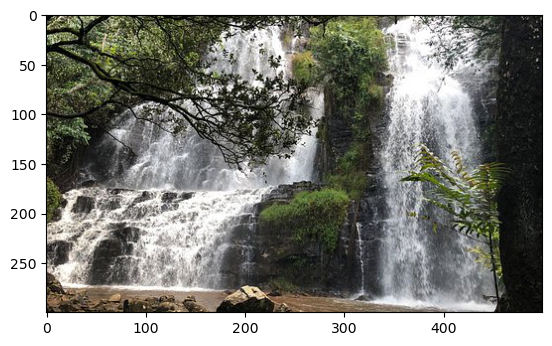

In [55]:
from PIL import Image
from matplotlib import pyplot

# Using matplotlib to show the image
image = Image.open(r'C:\Users\sacha\Downloads\chutesdekarera.jpg')
pyplot.imshow(image)
pyplot.show()

In [56]:
# Now that the image is loaded we need to convert it to a numpy array
import numpy as np
from bson.binary import Binary
import pickle
import pymongo

# img to np array
data = np.asarray(image)
# Check the shape
print(data.shape)
#init dict
post = {}
# pickle dump the numpy array and then binarize it (reminder MongoDB = Bson = Bytes json)
post['image'] = Binary( pickle.dumps( data, protocol=2) ) 

client = pymongo.MongoClient('localhost', 27017)
mydb = client["tutorial"]
collection = mydb["image"]
collection.insert_one(post)

(300, 500, 3)


InsertOneResult(ObjectId('662a63ae1d3b67b6d0442002'), acknowledged=True)

(300, 500, 3) <class 'numpy.ndarray'>


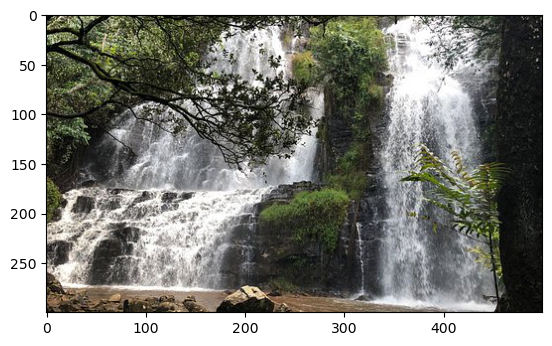

In [57]:
# Load it back
import pymongo
import pickle
from PIL import Image
from matplotlib import pyplot

client = pymongo.MongoClient('localhost', 27017)
mydb = client["tutorial"]
collection = mydb["image"]
docs = collection.find()
# load the binary object
doc =  pickle.loads(next(docs)["image"])
print(doc.shape,type(doc))
# From numpy to img
image = Image.fromarray(doc)
# Show image
pyplot.imshow(image)
pyplot.show()

14: Try to store a pandas dataframe in mongoDB (array with rownames, array with colnames and matrix with values)

In [58]:
import pandas as pd
import pymongo

client = pymongo.MongoClient('localhost', 27017)
mydb = client["tutorial"]
collection = mydb["dataframe"]
# Create a pandas DataFrame
data = {
    'A': [1, 2, 3],
    'B': [4, 5, 6],
    'C': [7, 8, 9]
}
df = pd.DataFrame(data)


# Convert DataFrame to dictionary
df_dict = df.to_dict(orient='split')

# Insert the dictionary into MongoDB
collection.insert_one(df_dict)

InsertOneResult(ObjectId('662a648a1d3b67b6d0442005'), acknowledged=True)

15: Insert the movie_review.tsv data into mongodb. Then query it to find the number of review that 
    are positive and negative review. Fetch the docs which have "unexpected" in their review,
    how many are they ? Think of a clever way to count the number of words in the review using MongoDB
    (hint: Transform the review text before the insert in MongoDB) and create a density of number of words per review.

In [60]:
df = pd.read_csv("C:/Users/sacha/Downloads/movie_review.tsv", sep='\t')
df.head()

,PhraseId,SentenceId,Phrase,Sentiment
0,1,1,A series of escapades demonstrating the adage ...,1
1,2,1,A series of escapades demonstrating the adage ...,2
2,3,1,A series,2
3,4,1,A,2
4,5,1,series,2


In [ ]:
from pymongo import MongoClient

# Function to preprocess the review text
def preprocess_text(text):
    # You can perform any necessary preprocessing here
    # For simplicity, let's just lowercase the text
    return text.lower()

# Function to insert data into MongoDB
def insert_data(file_path):
    client = MongoClient('localhost', 27017)  # Connect to MongoDB
    db = client['movie_reviews']  # Create or use a database called 'movie_reviews'
    collection = db['reviews']  # Create or use a collection called 'reviews'

    with open(file_path, 'r') as file:
        for line in file:
            data = line.strip().split('\t')  # Assuming tab-separated data
            phrase_id, sentence_id, phrase, sentiment = data
            preprocessed_phrase = preprocess_text(phrase)
            collection.insert_one({
                'phrase_id': phrase_id,
                'sentence_id': sentence_id,
                'phrase': preprocessed_phrase,
                'sentiment': sentiment
            })

# Function to count the number of positive and negative reviews
def count_sentiments():
    client = MongoClient('localhost', 27017)
    db = client['movie_reviews']
    collection = db['reviews']

    positive_count = collection.count_documents({'sentiment': '1'})  # Assuming '1' denotes positive sentiment
    negative_count = collection.count_documents({'sentiment': '0'})  # Assuming '0' denotes negative sentiment

    print("Number of positive reviews:", positive_count)
    print("Number of negative reviews:", negative_count)

# Insert data into MongoDB
insert_data('movie_review.tsv')

# Query MongoDB to count sentiments
count_sentiments()


In [5]:
import pandas as pd

# Assuming df is your DataFrame containing the data
df = pd.read_csv("C:/Users/sacha/Downloads/movie_review.tsv", sep='\t')

# Keep track of the first occurrence of each SentenceId
first_occurrences = {}

for index, row in df.iterrows():
    sentence_id = row['SentenceId']
    if sentence_id not in first_occurrences:
        first_occurrences[sentence_id] = index

# Extract the rows where SentenceId is the first occurrence
first_occurrence_rows = [df.iloc[index] for index in first_occurrences.values()]

# Create a new DataFrame with the desired rows
result_df = pd.DataFrame(first_occurrence_rows)

# Print the result DataFrame
result_df.head()


,PhraseId,SentenceId,Phrase,Sentiment
0,1,1,A series of escapades demonstrating the adage ...,1
63,64,2,"This quiet , introspective and entertaining in...",4
81,82,3,"Even fans of Ismail Merchant 's work , I suspe...",1
116,117,4,A positively thrilling combination of ethnogra...,3
156,157,5,Aggressive self-glorification and a manipulati...,1


In [7]:
result_df.to_csv('moviecleaned_review.csv', index=False)

moviecleaned_review.csv


In [9]:
from pymongo import MongoClient
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('moviecleaned_review.csv')

# Function to insert data into MongoDB
def insert_data_into_mongodb():
    client = MongoClient('localhost', 27017)  # Connect to MongoDB
    db = client['movie_reviews']  # Create or use a database called 'movie_reviews'
    collection = db['reviews']  # Create or use a collection called 'reviews'

    # Insert each row into the MongoDB collection
    for index, row in df.iterrows():
        document = {
            'PhraseId': row['PhraseId'],
            'SentenceId': row['SentenceId'],
            'Phrase': row['Phrase'],
            'Sentiment': row['Sentiment']
        }
        collection.insert_one(document)

# Function to query MongoDB and find the number of positive and negative reviews
def count_positive_negative_reviews():
    client = MongoClient('localhost', 27017)
    db = client['movie_reviews']
    collection = db['reviews']

    # Count the number of positive reviews (Sentiment = 3 or 4)
    positive_count = collection.count_documents({'Sentiment': {'$in': [3, 4]}})

    # Count the number of negative reviews (Sentiment = 0 or 1)
    negative_count = collection.count_documents({'Sentiment': {'$in': [0, 1]}})

    print("Number of positive reviews:", positive_count)
    print("Number of negative reviews:", negative_count)

# Insert data into MongoDB
insert_data_into_mongodb()

# Query MongoDB to count positive and negative reviews
count_positive_negative_reviews()


Number of positive reviews: 3602
Number of negative reviews: 3272


16: Download a sound sample. Try to store it in MongoDB

In [10]:
import requests
from pymongo import MongoClient

# Function to download and store the sound sample in MongoDB
def download_and_store_sound_sample(url):
    # Download the sound sample
    response = requests.get(url)
    sound_data = response.content

    # Connect to MongoDB
    client = MongoClient('localhost', 27017)
    db = client['sound_samples']
    collection = db['samples']

    # Store the sound sample in MongoDB
    sample_document = {
        'url': url,
        'sound_data': sound_data  # Store the binary sound data
    }
    collection.insert_one(sample_document)

    print("Sound sample stored in MongoDB.")

# URL of the sound sample to download
sound_sample_url = 'https://freesound.org/people/locky_Y/sounds/733168/'

# Download and store the sound sample in MongoDB
download_and_store_sound_sample(sound_sample_url)


Sound sample stored in MongoDB.


17: Create a collection with 30M observation with a single key : "year" which is a random value between 2000-2020.
        Get documents with year = 2000. Does using an index helps ?

In [ ]:
import random
import time
from tqdm import tqdm
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['TODO']  
collection = db['random']  

years = [random.randint(2000, 2020) for _ in range(30000000)]  

batch_size = 1000
batches = [years[i:i+batch_size] for i in range(0, len(years), batch_size)]

# Insérer les documents dans la collection MongoDB par lots avec tqdm
with tqdm(total=len(years), desc="Inserting documents") as pbar:
    for batch in batches:
        documents = [{"year": year} for year in batch]
        collection.insert_many(documents)
        pbar.update(len(batch))

# Mesurer les performances de la requête avec et sans l'index
start_time = time.time()
result = collection.find({"year": 2000})
end_time = time.time()
query_time_without_index = end_time - start_time
print("Query time without index:", query_time_without_index)

# Créer un index sur la clé "year"
collection.create_index([("year", 1)])

# Effectuer la même requête à nouveau pour mesurer avec l'index
start_time = time.time()
result = collection.find({"year": 2000})
end_time = time.time()
query_time_with_index = end_time - start_time
print("Query time with index:", query_time_with_index)

# Comparer les temps de requête
if query_time_with_index < query_time_without_index:
    print("Using an index improves query performance.")
else:
    print("Using an index does not significantly improve query performance.")

In [35]:
import pymongo
import random
import time

# Connect to MongoDB
client = pymongo.MongoClient('localhost', 27017)
db = client['mydatabase']
collection = db['random']

# Generate and insert 30M documents with random year values
for _ in range(30000000):
    year = random.randint(2000, 2020)
    document = {'year': year}
    collection.insert_one(document)

print("Documents inserted.")


KeyboardInterrupt: 

In [12]:
# Create an index on the "year" field
collection.create_index([('year', pymongo.ASCENDING)])

# Query documents with year = 2000
result = collection.find({'year': 2000})

# Loop through the results (optional)
for document in result:
    print(document)

    
## Creating an index on the "year" field helps MongoDB quickly
##locate documents with the specified value of "year", especially when dealing with large collections.

{'_id': ObjectId('662fa4f7dd79526b584cb7ae'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb7c6'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb7e8'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb7ff'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb815'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb82c'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb833'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb836'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb84b'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb859'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb873'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb893'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb8bb'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb8cc'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb8d7'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb8ed'), 'year': 2000}
{'_id': ObjectId('662fa4f7dd79526b584cb8

##                      Real World application 1
pubmed_cleaned.zip is a file containing a metadatas sample from pubmed articles.
Your goal is to convert the json to a mongo DB and answer the following questions USING mongodb querys:

In [38]:
import json
with open("C:/Users/sacha/Downloads/pubmed_cleaned/pubmed_cleaned.json") as file:
    json_data = json.load(file)
print(json_data[0])


{'_id': {'$oid': '60c715b4c4b7559e04fd9d24'}, 'pmid': 30006494, 'title': 'Proton pump inhibitors and gastric cancer: association is not causation.', 'ISSN': '1468-3288', 'abstract': None, 'meshwords': 'Anti-Ulcer Agents \nHelicobacter pylori \nHumans \nProton Pump Inhibitors \nStomach Neoplasms ', 'meshsubwords': '', 'authors': "name ml Moayyedi P, affil str Division of Gastroenterology and Farncombe Family Digestive Health Research Institute, McMaster University, Hamilton, Ontario, Canada.\nname ml Veldhuyzen van Zanten SJO, affil str Division of Gastroenterology, University of Alberta, Edmonton, Alberta, Canada.\nname ml Hookey L, affil str Division of Gastroenterology, Queen\\'s University, Kingston, Ontario, Canada.\nname ml Armstrong D, affil str Division of Gastroenterology and Farncombe Family Digestive Health Research Institute, McMaster University, Hamilton, Ontario, Canada.\nname ml Jones N, affil str Division of Gastroenterology, Hepatology, and Nutrition, The Hospital for S

In [39]:
import json
from pymongo import MongoClient

# Read the JSON file
with open("C:/Users/sacha/Downloads/pubmed_cleaned/pubmed_cleaned.json") as file:
    json_data = json.load(file)

# Connect to MongoDB
client = MongoClient('localhost', 27017)
db = client['mydatabase']  # Choose a database
collection = db['pubmed']  # Choose a collection

# Remove the _id field from each document
for doc in json_data:
    doc.pop('_id', None)

# Insert the JSON data into MongoDB
collection.insert_many(json_data)


InsertManyResult([ObjectId('66353726993373ecffd9b47b'), ObjectId('66353726993373ecffd9b47c'), ObjectId('66353726993373ecffd9b47d'), ObjectId('66353726993373ecffd9b47e'), ObjectId('66353726993373ecffd9b47f'), ObjectId('66353726993373ecffd9b480'), ObjectId('66353726993373ecffd9b481'), ObjectId('66353726993373ecffd9b482'), ObjectId('66353726993373ecffd9b483'), ObjectId('66353726993373ecffd9b484'), ObjectId('66353726993373ecffd9b485'), ObjectId('66353726993373ecffd9b486'), ObjectId('66353726993373ecffd9b487'), ObjectId('66353726993373ecffd9b488'), ObjectId('66353726993373ecffd9b489'), ObjectId('66353726993373ecffd9b48a'), ObjectId('66353726993373ecffd9b48b'), ObjectId('66353726993373ecffd9b48c'), ObjectId('66353726993373ecffd9b48d'), ObjectId('66353726993373ecffd9b48e'), ObjectId('66353726993373ecffd9b48f'), ObjectId('66353726993373ecffd9b490'), ObjectId('66353726993373ecffd9b491'), ObjectId('66353726993373ecffd9b492'), ObjectId('66353726993373ecffd9b493'), ObjectId('66353726993373ecffd9b4

1) Create an index, explain your choice of key.

In [40]:
collection.create_index([('pmid', pymongo.ASCENDING)])

'pmid_1'

2) Delete every paper that was published prior 2019

In [41]:
result = collection.delete_many({'date': {'$regex': 'year (19[0-9]{2}|20[0-1][0-8])'}})
print("Number of documents deleted:", result.deleted_count)

Number of documents deleted: 5


3) How many paper have a single author ? Two authors ?

In [42]:
# papers with single author
single_author_count = collection.count_documents({"team_size": 1})

# papers with two authors
two_authors_count = collection.count_documents({"team_size": 2})

# papers with other number of  authors
more_than_2_authors_count = collection.count_documents({"team_size": {"$gt": 2}})

print("Number of papers with a single author:", single_author_count)
print("Number of papers with two authors:", two_authors_count)
print("Nombre de documents avec plus de deux auteurs:", more_than_2_authors_count)

Number of papers with a single author: 5250
Number of papers with two authors: 10124
Nombre de documents avec plus de deux auteurs: 84035


4) What's the last paper inserted in the db ?

In [43]:
dernier_papier = collection.find_one(sort=[("pmid", -1)], projection={"_id": 1, "title": 1})

print("ID du dernier document inséré:", dernier_papier["_id"])
print("Titre du dernier document inséré:", dernier_papier["title"])


ID du dernier document inséré: 66353728993373ecffdb3b1a
Titre du dernier document inséré: Identification of a novel UDP-glycosyltransferase gene from Rhodiola rosea and its expression during biotransformation of upstream precursors in callus culture.


5) Find articles with null meshwords.

In [46]:
articles_sans_meshwords = collection.find({"$or": [{"meshwords": None}, {"meshwords": ""}]}, {"pmid": 1})

for article in articles_sans_meshwords:
    print(article['pmid'])

30618194
30620089
30620713
30621200
30625514
30626152
30630289
30631788
30635026
30636978
30638571
30641886
30641906
30642096
30642391
30644172
30645024
30645189
30646603
30646842
30646862
30647291
30650221
30651124
30651719
30651970
30651977
30652362
30652435
30652437
30654464
30654508
30654755
30654811
30655207
30656225
30657187
30659937
30661204
30661975
30663584
30663843
30664293
30664333
30665364
30665383
30665468
30666519
30667054
30669301
30669457
30669458
30669462
30669502
30669559
30669631
30669702
30670056
30672028
30672077
30672103
30673628
30673629
30677203
30677577
30677789
30678092
30678107
30678126
30678147
30678219
30678258
30678295
30678368
30678443
30678695
30678699
30680824
30681208
30681256
30681765
30681769
30682397
30682766
30682791
30682814
30682815
30682820
30682838
30682876
30683489
30684064
30684130
30684154
30684244
30684260
30684261
30684303
30684359
30685446
30685561
30685984
30688382
30688383
30689223
30689279
30689299
30689928
30690808
30691030
30691037
3

6) Choose a keyword you are interested in (machine learning, computer vision,...). 
   Find the number of articles with the choosen keyword in their meshwords, abstract or title.

In [35]:
# Count articles with "machine learning" in meshwords, abstract, or title
count = collection.count_documents({
    '$or': [
        {'meshwords': {'$regex': 'machine learning', '$options': 'i'}},
        {'abstract': {'$regex': 'machine learning', '$options': 'i'}},
        {'title': {'$regex': 'machine learning', '$options': 'i'}}
    ]
})

print("Number of articles with 'machine learning' in meshwords, abstract, or title:", count)


Number of articles with 'machine learning' in meshwords, abstract, or title: 521


7) What's the number of articles that have atleast one affiliation AND meshwords.

In [48]:
count = collection.count_documents({
    '$or': [
        {'authors': {'$regex': 'affil', '$options': 'i'}},
        {'mesh': {'$regex': 'machine learning', '$options': 'i'}},
        {'title': {'$regex': 'machine learning', '$options': 'i'}}
    ]
})

print("Number of articles with 'machine learning' in meshwords, abstract, or title:", count)


Number of articles with 'machine learning' in meshwords, abstract, or title: 99414


8) How many articles have a publishing date after 2020 ?

In [49]:
articles_after_2020 = collection.count_documents({
    "date_medline": {"$gt": "year 2020"}
})

print("Nombre d'articles avec une date de publication après 2020:", articles_after_2020)

Nombre d'articles avec une date de publication après 2020: 43470


9) Find articles where there's atleast one affiliation from a choosen country (you decide which one).

In [51]:
papers_with_Harvard_affiliation = collection.count_documents({
    "authors": {"$regex": "Harvard", "$options": "i"} 
})

print("Number of papers where 'Harvard' appears at least once in the affiliation:", papers_with_Harvard_affiliation)

Number of papers where 'Harvard' appears at least once in the affiliation: 1683


10) Check for any duplicates. (hint: look at the doi or the pmid)

In [53]:
pipeline = [
    {"$group": {"_id": "$pmid", "count": {"$sum": 1}}},
    {"$match": {"count": {"$gt": 1}}}
]
duplicate_pmids = list(collection.aggregate(pipeline))

# Count the number of PMIDs that appear multiple times
num_duplicate_pmids = len(duplicate_pmids)

print(num_duplicate_pmids)

0


11) Remove every articles where the abstract starts with an "R".

In [54]:
result = collection.delete_many({"abstract": {"$regex": "^R", "$options": "i"}})

12) Return the list of papers (pmid) where there's atleast one affiliation per author

In [55]:
query = [
    {"$project": {
        "_id": 0,
        "pmid": 1,
        "authors": {"$split": ["$authors", "\n"]}
    }},
    {"$addFields": {
        "affiliations": {"$map": {
            "input": "$authors",
            "in": {"$arrayElemAt": [{"$split": ["$$this", ", affil str "]}, 1]}
        }}
    }},
    {"$match": {
        "affiliations": {"$not": {"$in": [None, ""]}}
    }},
    {"$group": {
        "_id": "$pmid"
    }}
]

papers_with_affiliations_per_author = [paper["_id"] for paper in collection.aggregate(query)]

print("List of papers with at least one affiliation per author:")
print(papers_with_affiliations_per_author)

List of papers with at least one affiliation per author:
[31069646, 31032528, 31061141, 31103528, 31152075, 31190337, 31182498, 31194948, 31170377, 31005743, 31004936, 31075346, 30945746, 31200047, 30835061, 31065503, 31099066, 31145920, 31216358, 30879937, 31028096, 30834552, 31181790, 30934718, 30814248, 31100636, 31172043, 31031160, 31198984, 30758837, 31161330, 31204002, 31137890, 31163706, 30876693, 30997709, 30840917, 30795555, 31100879, 30793549, 31002788, 31126043, 30967910, 31146947, 31172373, 31062460, 31096263, 31125642, 31030270, 30777739, 30871201, 31101003, 31141020, 30945369, 31151507, 31105652, 31120971, 31183391, 31193389, 30976516, 31035400, 31127867, 30928406, 31198679, 31205413, 31055641, 31151221, 31199317, 30862493, 30959867, 31070299, 31034104, 31209989, 31171179, 31127053, 31061441, 31163345, 30956828, 31173215, 30895449, 30684359, 31212765, 31155657, 31179591, 31021036, 31116700, 30799934, 30970667, 31075708, 31044562, 31105728, 31035151, 31042482, 30704501, 30

13) Create 500 random samples of the dataset, compute a statistics that you are interested in and 
    check how it behaves through the different samples

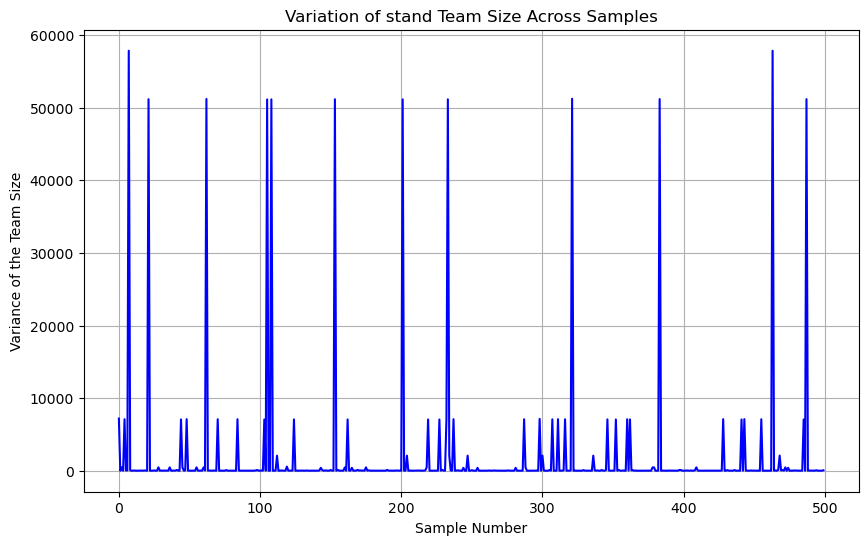

In [59]:
import matplotlib.pyplot as plt
num_samples = 500

variance_team_sizes = []

for i in range(num_samples):
    sample = list(collection.aggregate([{"$sample": {"size": 100}}]))
    
    team_sizes = [doc['team_size'] for doc in sample]
    variance_team_size = np.var(team_sizes)
    
    variance_team_sizes.append(mean_team_size)

plt.figure(figsize=(10, 6))
plt.plot(mean_team_sizes, color='blue')
plt.title('Variation of stand Team Size Across Samples')
plt.xlabel('Sample Number')
plt.ylabel('Variance of the Team Size')
plt.grid(True)
plt.show()

14) Sandbox exercise: think of a problematic and try to answer it.

In [63]:
# Requête pour compter le nombre d'articles faits en Europe
query_europe = {"is_eu": 1}
# Requête pour compter le nombre d'articles faits en dehors de l'Europe
query_non_europe = {"is_eu": {"$ne": 1}}

# Compter le nombre d'articles faits en Europe
nb_articles_europe = collection.count_documents(query_europe)
# Compter le nombre d'articles faits en dehors de l'Europe
nb_articles_non_europe = collection.count_documents(query_non_europe)

# Affichage des résultats
print(f"Nombre d'articles faits en Europe : {nb_articles_europe}")
print(f"Nombre d'articles faits en dehors de l'Europe : {nb_articles_non_europe}")


Nombre d'articles faits en Europe : 33561
Nombre d'articles faits en dehors de l'Europe : 66434


##              REAL WORLD APPLICATION 2
    authors.zip is a file containing a sample of authors that wrote a paper published on pubmed. 
    Each doc as, at most, 5 keys. "AND_ID" is the disambiguated author id. "pmid_list" is the list 
    of ids that the author published. "more_info" is a list of dict with each dict representing info
    for a given paper. "oa04_affiliations" is a list of dict with each dict representing affiliation info 
    for a given paper. "oa06_researcher_education" is a list of dict with each dict containing information 
    on the education of the researcher.
    

In [67]:
import json
from pymongo import MongoClient

# Read the JSON file
with open("C:/Users/sacha/Downloads/authors/authors.json", "r", encoding="utf-8") as file:
    json_data = json.load(file)

# Connect to MongoDB
client = MongoClient('localhost', 27017)
db = client['mydatabase']  # Choose a database
collection = db['pubmed2']  # Choose a collection

# Remove the _id field from each document
for doc in json_data:
    doc.pop('_id', None)

# Insert the JSON data into MongoDB
collection.insert_many(json_data)

InsertManyResult([ObjectId('66354c6a993373ecffdcc1bf'), ObjectId('66354c6a993373ecffdcc1c0'), ObjectId('66354c6a993373ecffdcc1c1'), ObjectId('66354c6a993373ecffdcc1c2'), ObjectId('66354c6a993373ecffdcc1c3'), ObjectId('66354c6a993373ecffdcc1c4'), ObjectId('66354c6a993373ecffdcc1c5'), ObjectId('66354c6a993373ecffdcc1c6'), ObjectId('66354c6a993373ecffdcc1c7'), ObjectId('66354c6a993373ecffdcc1c8'), ObjectId('66354c6a993373ecffdcc1c9'), ObjectId('66354c6a993373ecffdcc1ca'), ObjectId('66354c6a993373ecffdcc1cb'), ObjectId('66354c6a993373ecffdcc1cc'), ObjectId('66354c6a993373ecffdcc1cd'), ObjectId('66354c6a993373ecffdcc1ce'), ObjectId('66354c6a993373ecffdcc1cf'), ObjectId('66354c6a993373ecffdcc1d0'), ObjectId('66354c6a993373ecffdcc1d1'), ObjectId('66354c6a993373ecffdcc1d2'), ObjectId('66354c6a993373ecffdcc1d3'), ObjectId('66354c6a993373ecffdcc1d4'), ObjectId('66354c6a993373ecffdcc1d5'), ObjectId('66354c6a993373ecffdcc1d6'), ObjectId('66354c6a993373ecffdcc1d7'), ObjectId('66354c6a993373ecffdcc1

   1) Create an index, explain your choice of key.

In [68]:
collection.create_index([("AND_ID", 1)])

'AND_ID_1'

  2) What is the average length of "pmid_list"

In [77]:
pipeline = [
    {
        "$match": {
            "pmid_list": { "$exists": True, "$ne": None }  # Filtrer les documents ayant le champ "pmid_list" non nul
        }
    },
    {
        "$project": {
            "pmid_list_length": { "$size": "$pmid_list" }  # Projet de la taille de la liste "pmid_list"
        }
    },
    {
        "$group": {
            "_id": None,
            "average_pmid_list_length": { "$avg": "$pmid_list_length" }  # Calculer la moyenne de la taille de la liste "pmid_list"
        }
    }
]

result = collection.aggregate(pipeline)

for res in result:
    print("Average length of pmid:", res["average_pmid_list_length"])

Average length of pmid: 7.040832449946997


  3) How many distinct affiliations are there ?

In [76]:
pipeline = [
    {
        "$unwind": "$oa04_affiliations" 
    },
    {
        "$group": {
            "_id": "$oa04_affiliations.Affiliation", 
            "count": { "$sum": 1 } 
        }
    },
    {
        "$group": {
            "_id": None,
            "total_distinct_affiliations": { "$sum": 1 } 
        }
    }
]

result = collection.aggregate(pipeline)

for res in result:
    print("distinct affiliations:", res["total_distinct_affiliations"])

distinct affiliations: 318595


  4) Find authors with atleast one "COM" AffiliationType

In [73]:
query = {
    "oa04_affiliations": {
        "$elemMatch": {
            "AffiliationType": "COM" }}}

result = collection.find(query)
for res in result:
    print(res)

{'_id': ObjectId('66354c6a993373ecffdcc203'), 'AND_ID': 3450210, 'pmid_list': [5044566], 'more_info': [{'id': 14183379, 'PMID': 5044566, 'AND_ID': 3450210, 'AuOrder': 2, 'LastName': 'Schütze', 'ForeName': 'K', 'Initials': 'K', 'Suffix': {'$numberDouble': 'NaN'}, 'AuNum': 3, 'PubYear': 1972, 'BeginYear': 1972}], 'oa04_affiliations': [{'PMID': 24579129, 'AND_ID': 3450210, 'Affiliation': 'Philips Research Medisys, Suresnes, France.', 'Country': 'France', 'City': 'Suresnes, Nanterre, Paris, France', 'AffiliationType': 'COM', 'Latitude': 48.87, 'Longitude': 2.222}]}
{'_id': ObjectId('66354c6a993373ecffdcc20a'), 'AND_ID': 2524659, 'pmid_list': [266911, 291402, 594938, 600173, 1085389, 1152705, 4512922, 4637361, 4715767, 4777846, 4829550, 5440994, 5820534, 7001152, 7259352, 7432310, 10239950, 12981609, 13542322, 13918529, 13979390, 13979391, 14172400, 14886287, 18144341], 'more_info': [{'id': 663779, 'PMID': 266911, 'AND_ID': 2524659, 'AuOrder': 2, 'LastName': 'Sutherland', 'ForeName': 'H D',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'_id': ObjectId('66354c6d993373ecffdde576'), 'AND_ID': 9241261, 'pmid_list': [10872156, 10872157, 11205712, 11321749, 11511897, 11704436, 11704437, 11870449, 11901015, 11934093, 12008820, 12020978, 12042999, 12049304, 12063224, 12119332, 12164358, 12404524, 12439558, 12491017, 12552323, 12630636, 12636332, 12795561, 12834641, 12928956, 14504879, 14508616, 14510278, 14682436, 14992363, 15018193, 15048599, 15103574, 15208062, 15352679, 15361561, 15498922, 15505307, 15518865, 15642300, 15756667, 15763351, 15781539, 16004176, 16040221, 16051581, 16133595, 16163022, 16195812, 16245226, 16252193, 16372690, 16440224, 16547994, 16731901, 16928945, 16929013, 16985122, 17033800, 17060434, 17117313, 17380005, 17591319, 17598944, 17680520, 17874651, 17924314, 18204011, 19168779, 19263378, 19562828, 19701264, 20350800, 20533123, 20924351, 21049223, 21359870, 21469149, 21606791, 21621433, 21630200, 21785607, 21983848, 21997672, 22124776, 22189660, 22194524, 22213844, 22238353, 22270731, 22289542, 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  5) How many authors switched the AffiliationType ?

In [74]:
pipeline = [
    {
        "$unwind": "$oa04_affiliations" 
    },
    {
        "$group": {
            "_id": {"AND_ID": "$AND_ID", "AffiliationType": "$oa04_affiliations.AffiliationType"},  
            "count": { "$sum": 1 } 
        }
    },
    {
        "$group": {
            "_id": "$_id.AND_ID", 
            "switched_affiliation_types": { "$sum": { "$cond": [ { "$gt": ["$count", 1] }, 1, 0 ] } }  
        }
    },
    {
        "$match": {
            "switched_affiliation_types": { "$gt": 0 } 
        }
    },
    {
        "$count": "total_authors" 
    }
]

result = collection.aggregate(pipeline)

for res in result:
    print("Total authors who switched AffiliationType:", res["total_authors"])

Total authors who switched AffiliationType: 21392


  6) Find affiliation with the word "China"

In [75]:
query = {
    "oa04_affiliations.Country": "China"
}

# Fetching only a few documents that match the query
result = collection.find(query).limit(5)  # Adjust the number 5 as per your requirement

for doc in result:
    print(doc)


{'_id': ObjectId('66354c6a993373ecffdcc1c9'), 'AND_ID': 4757645, 'pmid_list': [1793842, 2983779, 4053964, 4151641, 7060448], 'more_info': [{'id': 4851522, 'PMID': 1793842, 'AND_ID': 4757645, 'AuOrder': 3, 'LastName': 'Kardanov', 'ForeName': 'N A', 'Initials': {'$numberDouble': 'NaN'}, 'Suffix': {'$numberDouble': 'NaN'}, 'AuNum': 6, 'PubYear': 1991, 'BeginYear': 1974}, {'id': 8741195, 'PMID': 2983779, 'AND_ID': 4757645, 'AuOrder': 3, 'LastName': 'Kardanov', 'ForeName': 'N A', 'Initials': {'$numberDouble': 'NaN'}, 'Suffix': {'$numberDouble': 'NaN'}, 'AuNum': 5, 'PubYear': 1985, 'BeginYear': 1974}, {'id': 11996911, 'PMID': 4053964, 'AND_ID': 4757645, 'AuOrder': 4, 'LastName': 'Kardanov', 'ForeName': 'N A', 'Initials': {'$numberDouble': 'NaN'}, 'Suffix': {'$numberDouble': 'NaN'}, 'AuNum': 5, 'PubYear': 1985, 'BeginYear': 1974}, {'id': 12248713, 'PMID': 4151641, 'AND_ID': 4757645, 'AuOrder': 5, 'LastName': 'Kardanov', 'ForeName': 'N A', 'Initials': {'$numberDouble': 'NaN'}, 'Suffix': {'$num

  7) Get the pmids of papers published in 2019

In [78]:
pipeline = [
    {"$unwind": "$more_info"},
    {"$match": {"more_info.PubYear": 2019}},
    {"$project": {"_id": 0, "more_info.PMID": 1}}
]

result = collection.aggregate(pipeline)

for doc in result:
    print(doc["more_info"]["PMID"])

30972486
30859659
31388046
31787945
31055204
30653778
30654984
30610279
31646943
30741784
31209822
30208688
30898728
31334037
31494165
31146430
31505779
31462497
30976187
31798834
30941096
30766685
31496388
31475411
31849345
30703819
30459414
30608615
30639533
31117741
31885501
31905792
30786153
31513211
31871873
31743069
31139686
30921325
29788036
30589384
30003526
31097639
31451907
31663854
31701556
30747246
31061434
31041574
31806906
30651277
30925591
30901190
30812014
31049739
31560445
31595929
30815724
30650664
32110467
29967953
29982291
30158374
30483876
31000109
31502103
31017659
30596355
31072626
30979409
31459452
31231679
31681781
31595387
30815274
31078625
31749979
31656281
31374983
30745863
30508688
31258375
30718616
31459701
31781709
30803011
30146248
31177873
31447891
31635495
31875779
31005900
31352731
31451342
31572568
31583074
31741673
30205162
30725365
31324720
30702045
30530494
31383886
31240575
31392559
30718276
30900169
30998696
31164793
30345707
30779426
32038137
3

  10) Count the distinct country of "oa06_researcher_education"

In [79]:
pipeline = [
    {"$match": {"oa06_researcher_education": {"$exists": True, "$ne": []}}},  # Assurez-vous que le champ existe et n'est pas vide
    {"$unwind": "$oa06_researcher_education"},  # Désagréger le tableau "oa06_researcher_education"
    {"$match": {"oa06_researcher_education.Country": {"$exists": True, "$ne": ""}}},  # Filtrer les documents où Country existe et n'est pas vide
    {"$group": {"_id": "$oa06_researcher_education.Country", "count": {"$sum": 1}}}  # Compter les pays distincts
]

result = list(collection.aggregate(pipeline))

# Afficher les résultats
for doc in result:
    print("Country:", doc["_id"], "Count:", doc["count"])

Country: TZ Count: 4
Country: IT Count: 215
Country: IS Count: 2
Country: US Count: 1160
Country: AU Count: 202
Country: SA Count: 8
Country: EE Count: 3
Country: PE Count: 12
Country: FR Count: 172
Country: FI Count: 39
Country: ET Count: 6
Country: CA Count: 158
Country: LB Count: 5
Country: GB Count: 405
Country: LV Count: 5
Country: UZ Count: 3
Country: IR Count: 74
Country: IL Count: 15
Country: BD Count: 5
Country: IN Count: 205
Country: ZA Count: 24
Country: KZ Count: 2
Country: CR Count: 1
Country: MA Count: 7
Country: LY Count: 1
Country: BE Count: 44
Country: SI Count: 3
Country: BY Count: 8
Country: BR Count: 193
Country: CZ Count: 13
Country: PK Count: 19
Country: NP Count: 5
Country: KW Count: 1
Country: TH Count: 10
Country: NG Count: 22
Country: TW Count: 25
Country: MZ Count: 3
Country: NZ Count: 30
Country: MX Count: 52
Country: HU Count: 21
Country: RU Count: 75
Country: KE Count: 5
Country: GH Count: 4
Country: PS Count: 1
Country: BA Count: 5
Country: AT Count: 40
C

      Sandbox exercise: think of a problematic and try to answer it.

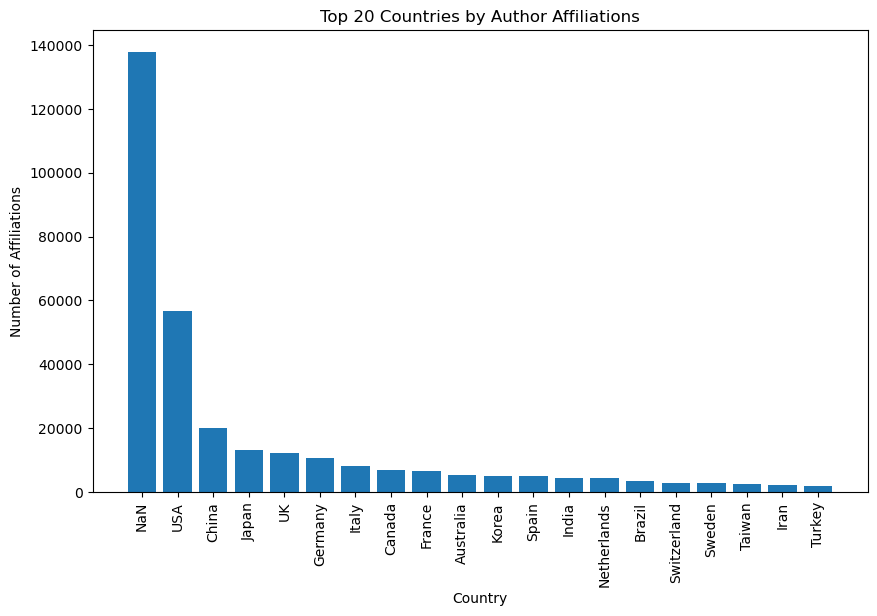

In [83]:
from pymongo import MongoClient
import matplotlib.pyplot as plt

# Connect to MongoDB
client = MongoClient('localhost', 27017)
db = client['mydatabase']  # Connect to your database
collection = db['pubmed2']  # Connect to your collection

# Query MongoDB to retrieve affiliations data
affiliations_data = collection.find({}, {"oa04_affiliations.Country": 1})

# Extract country information and count affiliations from each country
country_counts = {}
for doc in affiliations_data:
    affiliations = doc.get('oa04_affiliations', [])
    for affiliation in affiliations:
        country = affiliation.get('Country')
        if isinstance(country, dict):  # Check if country is a dictionary
            country = country.get('$numberDouble')  # Extract the value from the dictionary
        if country:
            country_counts[country] = country_counts.get(country, 0) + 1

# Sort countries by affiliation count in descending order
sorted_countries = sorted(country_counts.items(), key=lambda x: x[1], reverse=True)

# Take the top 20 countries
top_countries = sorted_countries[:20]
countries, counts = zip(*top_countries)  # Unzip the list of tuples

# Visualize the distribution of affiliations across countries
plt.figure(figsize=(10, 6))
plt.bar(countries, counts)
plt.xlabel('Country')
plt.ylabel('Number of Affiliations')
plt.title('Top 20 Countries by Author Affiliations')
plt.xticks(rotation=90)
plt.show()
